## Preprocessing

In [79]:
using CSV, DataFrames, Statistics, Plots, CategoricalArrays, Dates, Random, Gurobi, JuMP

In [80]:
data = CSV.read("MLOpt_data.csv", DataFrame)

y = data."No-show"

X = select(data, [:Gender_binary, :Age_std, :Scholarship, :Hipertension, :Diabetes, :Alcoholism, :Handcap, :SMS_received, :lead_time_std, :day_of_week, :appointment_month])
X_features = select(data, [:Gender_binary, :Age_std, :Scholarship, :Hipertension, :Diabetes, :Alcoholism, :Handcap, :SMS_received, :lead_time_std, :day_of_week, :appointment_month, :Neighbourhood])


Row,Gender_binary,Age_std,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,lead_time_std,day_of_week,appointment_month,Neighbourhood
,Int64,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Float64,String15,String7,String31
1,1,1.07858,0,1,0,0,0,0,-0.667653,Friday,April,JARDIM DA PENHA
2,0,0.818894,0,0,0,0,0,0,-0.667653,Friday,April,JARDIM DA PENHA
3,1,1.07858,0,0,0,0,0,0,-0.667653,Friday,April,MATA DA PRAIA
4,1,-1.25863,0,0,0,0,0,0,-0.667653,Friday,April,PONTAL DE CAMBURI
5,1,0.818894,0,1,1,0,0,0,-0.667653,Friday,April,JARDIM DA PENHA
6,1,1.68453,0,1,0,0,0,0,-0.536562,Friday,April,REPÚBLICA
7,1,-0.6094,0,0,0,0,0,0,-0.536562,Friday,April,GOIABEIRAS
8,1,0.0831057,0,0,0,0,0,0,-0.536562,Friday,April,GOIABEIRAS
9,1,-0.695964,0,0,0,0,0,0,-0.667653,Friday,April,ANDORINHAS


In [81]:
X.Gender_binary = CategoricalArray(X.Gender_binary)
X.Scholarship = CategoricalArray(X.Scholarship)
X.Hipertension = CategoricalArray(X.Hipertension)
X.Diabetes = CategoricalArray(X.Diabetes)
X.Alcoholism = CategoricalArray(X.Alcoholism)
X.Handcap = CategoricalArray(X.Handcap)
X.SMS_received = CategoricalArray(X.SMS_received)
X.day_of_week = CategoricalArray(X.day_of_week)
X.appointment_month = CategoricalArray(X.appointment_month)

X_features.Gender_binary = CategoricalArray(X_features.Gender_binary)
X_features.Scholarship = CategoricalArray(X_features.Scholarship)
X_features.Hipertension = CategoricalArray(X_features.Hipertension)
X_features.Diabetes = CategoricalArray(X_features.Diabetes)
X_features.Alcoholism = CategoricalArray(X_features.Alcoholism)
X_features.Handcap = CategoricalArray(X_features.Handcap)
X_features.SMS_received = CategoricalArray(X_features.SMS_received)
X_features.day_of_week = CategoricalArray(X_features.day_of_week)
X_features.appointment_month = CategoricalArray(X_features.appointment_month)
X_features.Neighbourhood = CategoricalArray(X_features.Neighbourhood)

110458-element CategoricalArray{String31,1,UInt32}:
 String31("JARDIM DA PENHA")
 String31("JARDIM DA PENHA")
 String31("MATA DA PRAIA")
 String31("PONTAL DE CAMBURI")
 String31("JARDIM DA PENHA")
 String31("REPÚBLICA")
 String31("GOIABEIRAS")
 String31("GOIABEIRAS")
 String31("ANDORINHAS")
 String31("CONQUISTA")
 ⋮
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")
 String31("MARIA ORTIZ")

In [82]:
seed = 15095
(X_trainvalid, y_trainvalid), (X_test, y_test) = IAI.split_data(:classification, X, y, seed=seed, train_proportion=0.8)
(X_train, y_train), (X_valid, y_valid) =  IAI.split_data(:classification, X_trainvalid, y_trainvalid, seed=seed, train_proportion=0.8);

(Xfeat_trainvalid, yfeat_trainvalid), (Xfeat_test, yfeat_test) = IAI.split_data(:classification, X, y, seed=seed, train_proportion=0.8)
(Xfeat_train, yfeat_train), (Xfeat_valid, yfeat_valid) =  IAI.split_data(:classification, Xfeat_trainvalid, yfeat_trainvalid, seed=seed, train_proportion=0.8);

## Feature Selection

In [83]:
grid = IAI.GridSearch(
    IAI.OptimalFeatureSelectionClassifier(
        random_seed=seed,
    ),
    sparsity=1:12,
)
IAI.fit!(grid, Xfeat_trainvalid, Array(yfeat_trainvalid), validation_criterion=:auc)

All Grid Results:

 Row │ sparsity  train_score  valid_score  rank_valid_score 
     │ Int64     Float64      Float64      Int64            
─────┼──────────────────────────────────────────────────────
   1 │        1    0.0308979     0.69331                  1
   2 │        2    0.0353047     0.656788                12
   3 │        3    0.038904      0.65837                 11
   4 │        4    0.0404003     0.659969                10
   5 │        5    0.0409848     0.660041                 9
   6 │        6    0.0413885     0.661043                 6
   7 │        7    0.0416255     0.661264                 5
   8 │        8    0.0416909     0.661485                 3
   9 │        9    0.041819      0.661758                 2
  10 │       10    0.0418773     0.660875                 7
  11 │       11    0.0419042     0.6613                   4
  12 │       12    0.0419735     0.660816                 8

Best Params:
  sparsity => 1

Best Model - Fitted OptimalFeatureSelectionClas

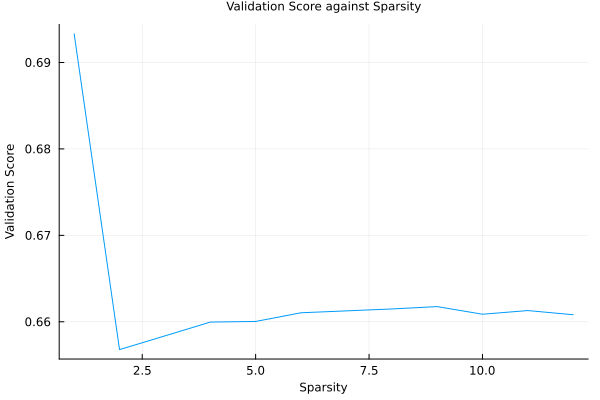

In [84]:
plot(grid, type=:validation)

In [85]:
IAI.variable_importance(IAI.get_learner(grid))

Row,Feature,Importance
,Symbol,Float64
1,lead_time_std,1.0
2,Age_std,0.0
3,Alcoholism=1,0.0
4,Diabetes=1,0.0
5,Gender_binary=1,0.0
6,Handcap=0,0.0
7,Handcap=1,0.0
8,Handcap=2,0.0
9,Handcap=3,0.0


## Predictions

### RF

In [86]:
# TODO Train a Random Forest 
# Grid search for hyperparameter tuning
max_depths = [15]
num_trees = [200]
minbuckets = [100, 200]
rf_grid = IAI.GridSearch(
    IAI.RandomForestClassifier(
        random_seed=seed,
        max_categoric_levels_before_warning=10000,
    ),
    max_depth=max_depths,
    num_trees=num_trees,
    minbucket=minbuckets,
)
# Fit training data
IAI.fit_cv!(rf_grid, X_trainvalid, Array(y_trainvalid), validation_criterion=:auc, n_folds=3)


# Calculate AUC score on the validation set (name the variable holding the AUC score as `val_auc`)
val_auc = IAI.score(rf_grid, X_valid, y_valid, criterion=:auc)

0.7589772832042827

In [87]:
# TODO: Get best model
model = rf_grid
lnr_rf = IAI.get_learner(model)

# TODO: Display selected model's parameters
params = IAI.get_params(lnr_rf)
println(params)
println("Max depth of the best model is ", params[:max_depth])
println("Number of trees of the best model is ", params[:num_trees])
println("Minbucket size of the best model is ", params[:minbucket])

Dict{Symbol, Any}(:fast_num_support_restarts => 0, :max_categoric_levels_before_warning => 10000, :split_features => All{Tuple{}}(()), :fast_test_intermediate_support => true, :num_trees => 200, :parallel_processes => nothing, :num_threads => nothing, :max_features => :auto, :show_progress => false, :checkpoint_max_files => nothing, :max_depth => 15, :hyperplane_config => NamedTuple[], :checkpoint_interval => 10, :regression_features => Any[], :weighted_minbucket => 1, :treat_unknown_level_missing => false, :random_seed => 15095, :checkpoint_dir => nothing, :fast_cumulative_support => true, :missingdatamode => :none, :refit_learner => nothing, :checkpoint_file => nothing, :fast_num_support_iterations => 1, :normalize_X => true, :bootstrap_samples => true, :criterion => :gini, :minbucket => 100, :cp_tuning_se_tolerance => 0.0, :cp => 0)
Max depth of the best model is 15
Number of trees of the best model is 200
Minbucket size of the best model is 100


In [88]:
# TODO: Calculate AUC score for test data
auc_score_rf = IAI.score(model, X_test, y_test, criterion=:auc)

# Get class predictions for test set
acc_rf = IAI.score(model, X_test, y_test, criterion=:misclassification)

println("Test AUC score: ", round(auc_score_rf, digits=4))
println("Test Accuracy: ", round(acc_rf, digits=4))

Test AUC score: 0.7331
Test Accuracy: 0.7978


### CART

In [89]:

max_depths = [12,15,18]
minbuckets = [100,200]

grid_cart = IAI.GridSearch(
    IAI.OptimalTreeClassifier(
        random_seed=seed,
        localsearch = false,
    ),
    max_depth=max_depths,
    minbucket=minbuckets,
    criterion=:gini
)

IAI.fit_cv!(grid_cart, X_trainvalid, Array(y_trainvalid), validation_criterion=:auc, n_folds=3)

All Grid Results:

 Row │ minbucket  criterion  max_depth  cp           split1_train_score  split2_train_score  split3_train_score  mean_train_score  std_train_score  split1_valid_score  split2_valid_score  split3_valid_score  mean_valid_score  std_valid_score  split1_cp    split2_cp    split3_cp    mean_cp      std_cp       overall_valid_score  rank_valid_score 
     │ Int64      Symbol     Int64      Float64      Float64             Float64             Float64             Float64           Float64          Float64             Float64             Float64             Float64           Float64          Float64      Float64      Float64      Float64      Float64      Float64              Int64            
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │       100  gini              12  0.000215048            0.124366            0.123963            0.124348          0.124225      0.000227478            0.722431            0.72303             0.722052          0.722505      0.000492825  0.000209008  0.000215048  0.000332063  0.00025204   6.93682e-5              0.722242                 5
   2 │       100  gini              15  0.000215048            0.125565            0.12553             0.125986          0.125694      0.000253781            0.722431            0.72303             0.722052          0.722505      0.000492825  0.000209008  0.000215048  0.000332063  0.00025204   6.93682e-5              0.722242                 6
   3 │       100  gini              18  0.000215048            0.125666            0.125849            0.126372          0.125962      0.000366202            0.722431            0.72303             0.722052          0.722505      0.000492825  0.000209008  0.000215048  0.000332063  0.00025204   6.93682e-5              0.722242                 4
   4 │       200  gini              12  0.000215048            0.11604             0.115376            0.115726          0.115714      0.00033176             0.723086            0.723319            0.721806          0.722737      0.000814824  0.00012039   8.75394e-5   0.000321221  0.000176383  0.000126504             0.722304                 1
   5 │       200  gini              15  0.000215048            0.116114            0.115736            0.115892          0.115914      0.000189885            0.723086            0.723271            0.721806          0.722721      0.000798091  0.00012039   8.94804e-5   0.000321221  0.00017703   0.000125825             0.722304                 3
   6 │       200  gini              18  0.000215048            0.116114            0.115768            0.115892          0.115925      0.000175218            0.723086            0.723271            0.721806          0.722721      0.000798091  0.00012039   8.94804e-5   0.000321221  0.00017703   0.000125825             0.722304                 2

Best Params:
  minbucket => 200
  cp => 0.0002150480321117902
  criterion => gini
  max_depth => 12

Best Model - Fitted OptimalTreeClassifier:
  1) Split: lead_time_std < -0.6349
    2) Split: Age_std < -0.7176
      3) Split: Age_std < -1.324
        4) Predict: 0 (96.97%), [4516,141], 4657 points, error 0.05872
        5) Split: Gender_binary is 1 or is missing
          6) Predict: 0 (94.13%), [2964,185], 3149 points, error 0.1106
          7) Split: day_of_week in [Friday,Wednesday] or is missing
            8) Predict: 0 (79.35%), [880,229], 1109 points, error 0.3277
            9) Predict: 0 (90.33%), [1271,136], 1407 points, error 0.1746
      10) Predict: 0 (96.43%), [19799,734], 20533 points, error 0.06894
    11) Split: Age_std < 0.4943
      12) Split: lead_time_std < -0.04497
        13) Split: lead_time_std < -0.3727
          14) Predic

In [90]:
# TODO: Get best model
model = grid_cart
lnr_cart = IAI.get_learner(model)

# TODO: Display selected model's parameters
params = IAI.get_params(lnr_cart)
println(params)
println("Max depth of the best model is ", params[:max_depth])
println("Minbucket size of the best model is ", params[:minbucket])

Dict{Symbol, Any}(:localsearch => false, :fast_num_support_restarts => 0, :max_categoric_levels_before_warning => 10, :split_features => All{Tuple{}}(()), :fast_test_intermediate_support => true, :ls_ignore_errors => false, :ls_num_hyper_restarts => 5, :max_depth => 12, :parallel_processes => nothing, :num_threads => nothing, :hyperplane_config => NamedTuple[], :show_progress => false, :ls_warmstart_criterion => :gini, :checkpoint_interval => 10, :ls_max_hyper_iterations => 9223372036854775807, :regression_features => Any[], :checkpoint_max_files => nothing, :weighted_minbucket => 1, :ls_bootstrap_samples => false, :treat_unknown_level_missing => false, :random_seed => 15095, :checkpoint_dir => nothing, :ls_num_greedy_features => :auto, :fast_cumulative_support => true, :missingdatamode => :none, :refit_learner => nothing, :fast_num_support_iterations => 1, :checkpoint_file => nothing, :normalize_X => true, :ls_num_categoric_restarts => 10, :criterion => :gini, :minbucket => 200, :ls_m

In [91]:
# TODO: Calculate AUC score for test data
auc_score_cart = IAI.score(model, X_test, y_test, criterion=:auc)

# Get class predictions for test set
acc_cart = IAI.score(model, X_test, y_test, criterion=:misclassification)

println("Test AUC score: ", round(auc_score_cart, digits=4))
println("Test Accuracy: ", round(acc_cart, digits=4))

Test AUC score: 0.724
Test Accuracy: 0.7981


## OCT

In [92]:
# Train an OCT, this grid search might take some time
# Grid search for hyperparameter tuning
# TODO: 
max_depths = [4,6,8]
minbuckets = [100, 200]

grid_oct = IAI.GridSearch(
    IAI.OptimalTreeClassifier(
        random_seed=seed,
        max_categoric_levels_before_warning=10000,
    ),
    max_depth=max_depths,
    minbucket=minbuckets,
    criterion=:gini,
) 

IAI.fit_cv!(grid_oct, X_trainvalid, Array(y_trainvalid), validation_criterion=:auc, n_folds=3)

All Grid Results:

 Row │ minbucket  criterion  max_depth  cp           split1_train_score  split2_train_score  split3_train_score  mean_train_score  std_train_score  split1_valid_score  split2_valid_score  split3_valid_score  mean_valid_score  std_valid_score  split1_cp    split2_cp   split3_cp    mean_cp      std_cp       overall_valid_score  rank_valid_score 
     │ Int64      Symbol     Int64      Float64      Float64             Float64             Float64             Float64           Float64          Float64             Float64             Float64             Float64           Float64          Float64      Float64     Float64      Float64      Float64      Float64              Int64            
─────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │       100  gini               4  8.24704e-6             0.102221            0.102453            0.101859          0.102178      0.000299304            0.72116             0.721389            0.720518          0.721022      0.000451165  8.24704e-6   3.55128e-5  0.00036267   0.000135477  0.000197227             0.72097                  4
   2 │       100  gini               6  1.31341e-5             0.109253            0.108869            0.109232          0.109118      0.000215856            0.720543            0.722712            0.721549          0.721601      0.00108549   5.30081e-6   1.31027e-5  0.000145643  5.46823e-5   7.88711e-5              0.72137                  2
   3 │       100  gini               8  0.000157031            0.116917            0.11583             0.117044          0.116597      0.000667477            0.719631            0.72088             0.720876          0.720462      0.000720254  0.000124378  0.00015733  0.000114061  0.000131923  2.25998e-5              0.720307                 6
   4 │       200  gini               4  2.04517e-5             0.102146            0.102233            0.101835          0.102071      0.00020911             0.721302            0.721116            0.720834          0.721084      0.000235432  1.34923e-5   2.04517e-5  9.37786e-5   4.25742e-5   4.44806e-5              0.721068                 3
   5 │       200  gini               6  1.3362e-5              0.108441            0.107969            0.10935           0.108587      0.000702192            0.721798            0.722999            0.720725          0.721841      0.00113725   1.6451e-5    1.80136e-5  9.48242e-5   4.30962e-5   4.48045e-5              0.72179                  1
   6 │       200  gini               8  0.000140048            0.113662            0.11343             0.114759          0.113951      0.000709913            0.72067             0.721869            0.720949          0.721163      0.000627572  0.00014065   8.76054e-6  0.000192672  0.000114027  9.4802e-5               0.720939                 5

Best Params:
  minbucket => 200
  cp => 1.3361958865643064e-5
  criterion => gini
  max_depth => 6

Best Model - Fitted OptimalTreeClassifier:
  1) Split: SMS_received is 1 or is missing
    2) Split: Age_std < 0.3212
      3) Split: Age_std < -1.064
        4) Split: Age_std < -1.583
          5) Split: day_of_week in [Friday,Thursday,Tuesday] or is missing
            6) Predict: 0 (78.77%), [308,83], 391 points, error 0.3344
            7) Predict: 0 (74.31%), [243,84], 327 points, error 0.3818
          8) Split: lead_time_std < 0.2828
            9) Split: lead_time_std < -0.1761
              10) Predict: 0 (76.49%), [934,287], 1221 points, error 0.3596
              11) Predict: 0 (70.65%), [638,265], 903 points, error 0.4147
            12) Split: appointment_month in [April,May] or is missing
              13) Predict: 0 (65.35%), [875,464], 1339 poin

In [93]:
# TODO: Get best model
model = grid_oct
lnr_oct = IAI.get_learner(model)

# TODO: Display selected model's parameters
params = IAI.get_params(lnr_oct)
println(params)
println("Max depth of the best model is ", params[:max_depth])
println("Minbucket size of the best model is ", params[:minbucket])

Dict{Symbol, Any}(:localsearch => true, :fast_num_support_restarts => 0, :max_categoric_levels_before_warning => 10000, :split_features => All{Tuple{}}(()), :fast_test_intermediate_support => true, :ls_ignore_errors => false, :ls_num_hyper_restarts => 5, :max_depth => 6, :parallel_processes => nothing, :num_threads => nothing, :hyperplane_config => NamedTuple[], :show_progress => false, :ls_warmstart_criterion => :gini, :checkpoint_interval => 10, :ls_max_hyper_iterations => 9223372036854775807, :regression_features => Any[], :checkpoint_max_files => nothing, :weighted_minbucket => 1, :ls_bootstrap_samples => false, :treat_unknown_level_missing => false, :random_seed => 15095, :checkpoint_dir => nothing, :ls_num_greedy_features => :auto, :fast_cumulative_support => true, :missingdatamode => :none, :refit_learner => nothing, :fast_num_support_iterations => 1, :checkpoint_file => nothing, :normalize_X => true, :ls_num_categoric_restarts => 10, :criterion => :gini, :minbucket => 200, :ls_

In [94]:
# TODO: Calculate AUC score for test data
auc_score_oct = IAI.score(model, X_test, y_test, criterion=:auc)

# Get class predictions for test set
acc_oct = IAI.score(model, X_test, y_test, criterion=:misclassification)

println("Test AUC score: ", round(auc_score_oct, digits=4))
println("Test Accuracy: ", round(acc_oct, digits=4))

Test AUC score: 0.7253
Test Accuracy: 0.7981


## Prescription

In [97]:
const C_IDLE  = 150.0
const C_DELAY = 75.0

# y_train: 1 = no-show, 0 = show
function leaf_costs_from_training_tree(lnr::IAI.TreeLearner,
                                       X_train,
                                       y_train;
                                       c_idle::Float64 = C_IDLE,
                                       c_delay::Float64 = C_DELAY)

    node_inds = IAI.apply_nodes(lnr, X_train)
    num_nodes = length(node_inds)

    leaf_cost0  = zeros(Float64, num_nodes)
    leaf_cost1  = zeros(Float64, num_nodes)
    leaf_p_show = zeros(Float64, num_nodes)

    for t in 1:num_nodes
        inds = node_inds[t]
        if isempty(inds) || !IAI.is_leaf(lnr, t)
            continue
        end

        n_leaf = length(inds)
        num_no   = sum(y_train[inds] .== 1)
        num_show = n_leaf - num_no

        frac_no   = num_no   / n_leaf
        frac_show = num_show / n_leaf

        leaf_cost0[t]  = c_idle  * frac_no
        leaf_cost1[t]  = c_delay * frac_show
        leaf_p_show[t] = frac_show
    end

    return leaf_cost0, leaf_cost1, leaf_p_show
end


leaf_costs_from_training_tree (generic function with 1 method)

In [98]:
function prescribe_tree_with_gurobi(lnr::IAI.TreeLearner,
                                    X_train,
                                    y_train,
                                    X_test;
                                    c_idle::Float64 = C_IDLE,
                                    c_delay::Float64 = C_DELAY)

    leaf_cost0, leaf_cost1, leaf_p_show =
        leaf_costs_from_training_tree(lnr, X_train, y_train;
                                      c_idle=c_idle, c_delay=c_delay)

    leaf_test = IAI.apply(lnr, X_test)
    n_test = length(leaf_test)

    model = Model(Gurobi.Optimizer)
    set_silent(model)

    @variable(model, z[1:n_test], Bin)   

    @objective(model, Min,
        sum( leaf_cost0[leaf_test[j]] * (1 - z[j]) +
             leaf_cost1[leaf_test[j]] * z[j]
             for j in 1:n_test)
    )

    optimize!(model)

    z_opt = Int.(round.(value.(z)))

    cost_base = [leaf_cost0[leaf_test[j]] for j in 1:n_test]
    cost_pol  = [leaf_cost0[leaf_test[j]] * (1 - z_opt[j]) +
                 leaf_cost1[leaf_test[j]] * z_opt[j]
                 for j in 1:n_test]

    avg_cost_base = mean(cost_base)
    avg_cost_pol  = mean(cost_pol)
    savings       = avg_cost_base - avg_cost_pol

    seen_base = Float64[]
    seen_pol  = Float64[]
    for j in 1:n_test
        p = leaf_p_show[leaf_test[j]]    
        push!(seen_base, p)              
        b = 1 + z_opt[j]                 
        push!(seen_pol, 1 - (1 - p)^b)   
    end

    avg_seen_base = mean(seen_base)
    avg_seen_pol  = mean(seen_pol)
    extra_seen    = avg_seen_pol - avg_seen_base

    return (
        z_opt         = z_opt,
        avg_cost_base = avg_cost_base,
        avg_cost_pol  = avg_cost_pol,
        savings       = savings,
        avg_seen_base = avg_seen_base,
        avg_seen_pol  = avg_seen_pol,
        extra_seen    = extra_seen,
    )
end


prescribe_tree_with_gurobi (generic function with 1 method)

In [99]:
function prescribe_rf_with_gurobi(rf_lnr,
                                  X_test;
                                  c_idle::Float64 = C_IDLE,
                                  c_delay::Float64 = C_DELAY)

    proba = IAI.predict_proba(rf_lnr, X_test)
    p_no   = proba[:, 2]           
    p_show = 1 .- p_no             

    n_test = length(p_show)

    cost0 = c_idle  .* (1 .- p_show)
    cost1 = c_delay .* p_show

    model = Model(Gurobi.Optimizer)
    set_silent(model)

    @variable(model, z[1:n_test], Bin)

    @objective(model, Min,
        sum(cost0[j] * (1 - z[j]) + cost1[j] * z[j] for j in 1:n_test)
    )

    optimize!(model)

    z_opt = Int.(round.(value.(z)))

    cost_base = cost0                 
    cost_pol  = [cost0[j] * (1 - z_opt[j]) + cost1[j] * z_opt[j]
                 for j in 1:n_test]

    avg_cost_base = mean(cost_base)
    avg_cost_pol  = mean(cost_pol)
    savings       = avg_cost_base - avg_cost_pol

    seen_base = p_show                            
    seen_pol  = [1 - (1 - p_show[j])^(1 + z_opt[j]) for j in 1:n_test]

    avg_seen_base = mean(seen_base)
    avg_seen_pol  = mean(seen_pol)
    extra_seen    = avg_seen_pol - avg_seen_base

    return (
        z_opt         = z_opt,
        avg_cost_base = avg_cost_base,
        avg_cost_pol  = avg_cost_pol,
        savings       = savings,
        avg_seen_base = avg_seen_base,
        avg_seen_pol  = avg_seen_pol,
        extra_seen    = extra_seen,
    )
end


prescribe_rf_with_gurobi (generic function with 1 method)

In [100]:
# Best learners from your grids
oct_lnr  =lnr_oct
cart_lnr =lnr_cart
rf_lnr   =lnr_rf

res_oct  = prescribe_tree_with_gurobi(oct_lnr,  X_train, y_train, X_test)
res_cart = prescribe_tree_with_gurobi(cart_lnr, X_train, y_train, X_test)
res_rf   = prescribe_rf_with_gurobi(rf_lnr, X_test)

println("=== Expected Cost (BRL per slot) ===")
println("OCT:   baseline = ", round(res_oct.avg_cost_base,  digits=2),
        ", policy = ",        round(res_oct.avg_cost_pol,   digits=2),
        ", savings = ",       round(res_oct.savings,        digits=2))

println("CART:  baseline = ", round(res_cart.avg_cost_base, digits=2),
        ", policy = ",        round(res_cart.avg_cost_pol,  digits=2),
        ", savings = ",       round(res_cart.savings,       digits=2))

println("RF:    baseline = ", round(res_rf.avg_cost_base,   digits=2),
        ", policy = ",        round(res_rf.avg_cost_pol,    digits=2),
        ", savings = ",       round(res_rf.savings,         digits=2))

println("\n=== Expected Patients Seen per Slot ===")
println("OCT:   baseline = ", round(res_oct.avg_seen_base,  digits=4),
        ", policy = ",        round(res_oct.avg_seen_pol,   digits=4),
        ", extra = ",         round(res_oct.extra_seen,     digits=4))

println("CART:  baseline = ", round(res_cart.avg_seen_base, digits=4),
        ", policy = ",        round(res_cart.avg_seen_pol,  digits=4),
        ", extra = ",         round(res_cart.extra_seen,    digits=4))

println("RF:    baseline = ", round(res_rf.avg_seen_base,   digits=4),
        ", policy = ",        round(res_rf.avg_seen_pol,    digits=4),
        ", extra = ",         round(res_rf.extra_seen,      digits=4))

Set parameter Username
Set parameter LicenseID to value 2710905
Academic license - for non-commercial use only - expires 2026-09-20
Set parameter Username
Set parameter LicenseID to value 2710905
Academic license - for non-commercial use only - expires 2026-09-20
Set parameter Username
Set parameter LicenseID to value 2710905
Academic license - for non-commercial use only - expires 2026-09-20
=== Expected Cost (BRL per slot) ===
OCT:   baseline = 30.24, policy = 28.06, savings = 2.18
CART:  baseline = 30.35, policy = 28.63, savings = 1.72
RF:    baseline = 30.32, policy = 28.44, savings = 1.88

=== Expected Patients Seen per Slot ===
OCT:   baseline = 0.7984, policy = 0.8428, extra = 0.0444
CART:  baseline = 0.7977, policy = 0.8386, extra = 0.0409
RF:    baseline = 0.7978, policy = 0.8367, extra = 0.0388
